In [ ]:
%matplotlib inline

# Report writing and scenario results

`ModelFlow`, standard pandas routines and other python libraries like `Matplotlib` and `Plotly` can be used to visualize and compare dataframes and therefore the results, from scenarios -- as indeed has been done in the preceding paragraphs. 

In addition, `ModelFlow` also provides several specific routines that make such comparisons easier. 

### Prepare workspace

In [1]:
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')
  incolab = True  
else:
  incolab = False 
from modelclass import model 
model.widescreen()
model.scroll_off()

from IPython.display import display, Markdown, HTML
from pathlib import Path 
import glob

### Load up some pre-run scenarios

The carbon tax scenarios run in the previous chapter can be used to illustrate some of the report writing features in the `modelflow` framework.  The data and model was used there was stored in the pakCarbonTaxScenarios/pcim file, which can be loaded with the modelload method.

In [3]:
#Reload the resutls of the carbon tax scenarios
mpak,exostart = model.modelload('..\models\pakCarbonTaxScenarios.pcim',run=1,silent=1)

file read:  C:\mflow\modelflow-manual\papers\mfbook\content\models\pakCarbonTaxScenarios.pcim


## The Keep option
Recall that when those scenarios were run, the `keep` option was declared, which caused `modelfow` to store the results of each scenario in as a `DataFrame` identified by the text description given with the keep option.

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed above, the `keep` option was activated. This causes the results from each simulation in a unique `DataFrame` that can be identified by the descriptor given to it.  

## The `.keep_plot()` method

The keep_plot method can be used to plot and compare results from the various scenarios that had been run earlier using the `keep=` option. 

By default the results across all scenarios for each selected variables will be shown on one chart at a time.


{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

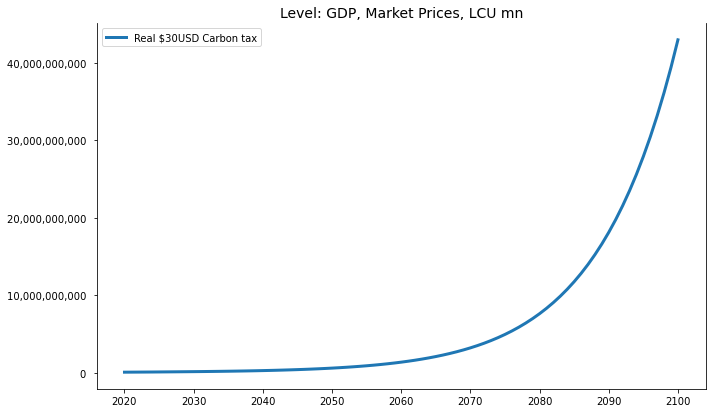

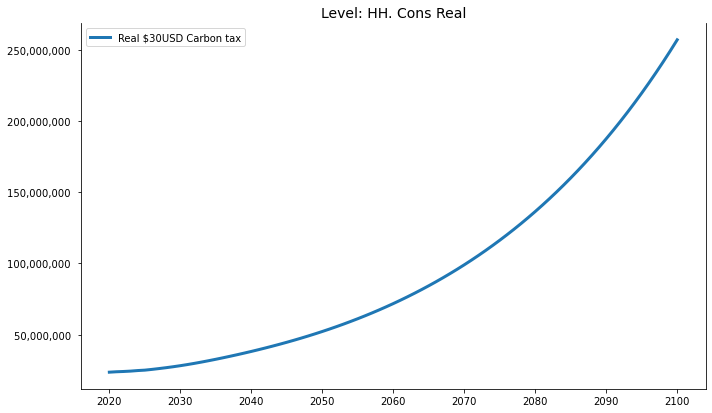

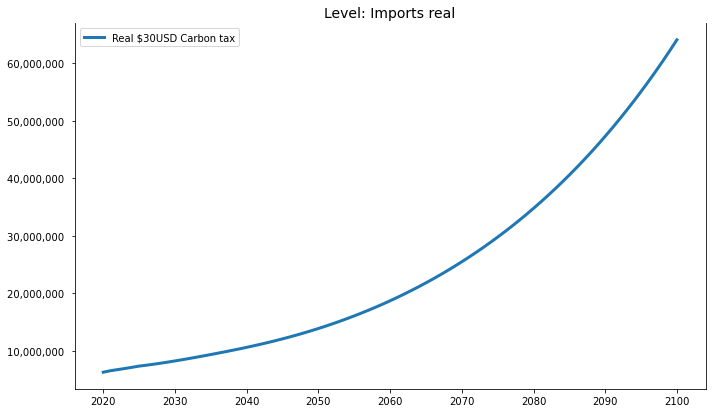

In [4]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN',  legend=True)
#show for each variable on a separate chart the results from each kept scenario

### `keep_plot()` options

The **variables** to be displayed are listed as first argument. Variable names can include 
wildcards (using * for any string and ? for any character).

**Transformation of data displayed:** 

| showtype= |Use this operator|
| :- | :---|
 'level' (default)|No transformation  
 'growth'| The growth rate  in percent 
 'change'| The yearly change ($\Delta$) 

**legend placement**

| legend= |Use this operator|
| :- | :---|
 False (default) |The legends are  placed at the end of the corresponding line
 True|The legends are places in a legend box


Often it is useful to compare the scenario results with the baseline result. This is done with the diff argument. 

| diff= |Use this operator|
| :- | :---|
 |False (default) |All entries in the keep_solution dictionary are displayed|
 |True|The difference to the first entry is shown.|

It can also be useful to compare the scenario results with the baseline result **measured in percent**. This is done with the diffpct argument. 

| diffpct= |Use this operator|
| :- | :---|
 False (default) |All entries in the keep_solution dictionary is displayed
 True|The difference in percent to the first entry is shown
 
 
 :::{note}
`'keep_plot()` and `.keep_plot_multi()` return a python object that points to the in memory version of the rendered figure(s).  This object can be used to modify the graph (see examples towards the end of this chapter.
 
 :::
 
 ```savefig='[path/]<prefix>.<extension>'```
 Will create a number of files with the charts.<br>
 The files will be saved location with name ```<path>/<prefix><variable name>.<extension>``` <br>The extension determines the 
 format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions. 

### An example using the diff=TRUE option

When `diff=True` (or 1) results will be shown all of the selected scenarios presented as the change in selected variables with respect to the first scenario -- in this instance the scenario saves with the name `baseline`.  

:::{warning|
Note in this instance `baseline` and `basedf` are the same because they were defined that way.  However, there is nothing in the system that guarantees that the first `keep` scenario will be the baseline or the `basedf` scenario.
:::

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

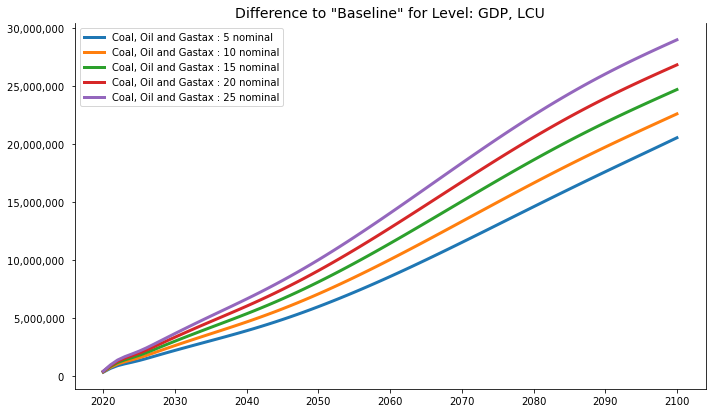

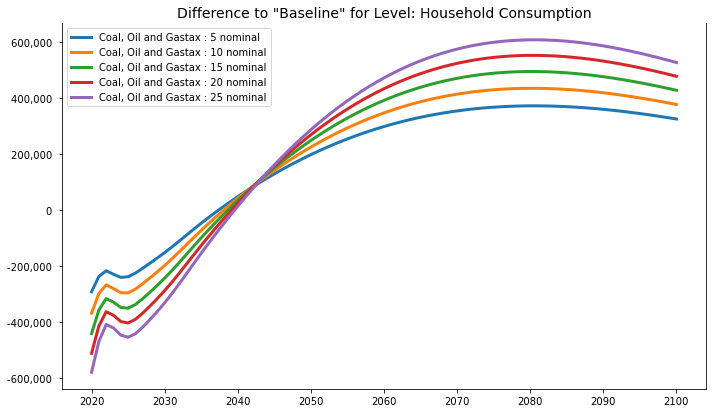

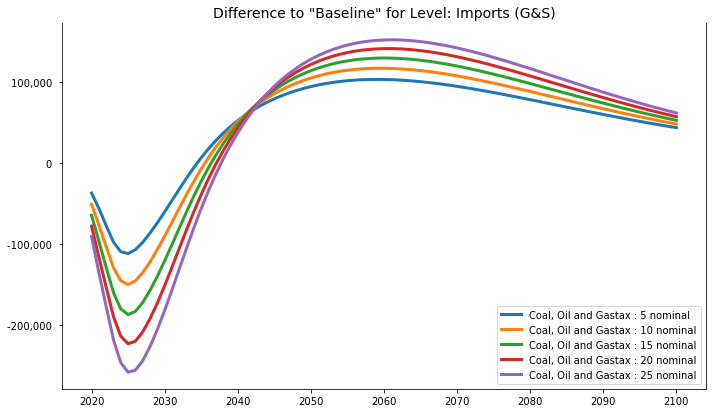

In [357]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN', diff=1, legend=True)

### The `showtype` option

In this example the difference with respect first `'keep` scenario `baseline` values are once again shown. This time the `showtype` option has been set to `growth`.  As a result the data is displayed as the  difference in the growth rate.  

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

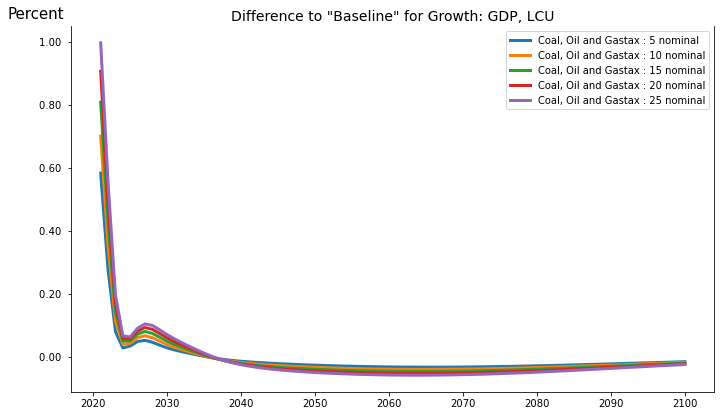

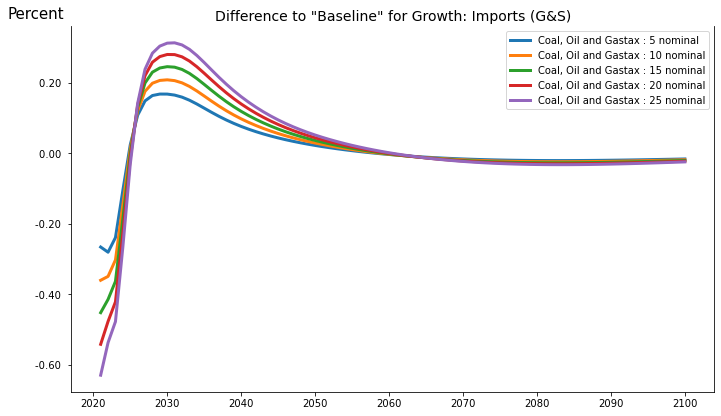

In [358]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True)

### The diffpct option

Setting `diffpct=True` instructs `.keep_plot()` to display the data as a percent deviation from the first `keep` scenario.

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNEIMPGNFSKN': <Figure size 720x432 with 1 Axes>}

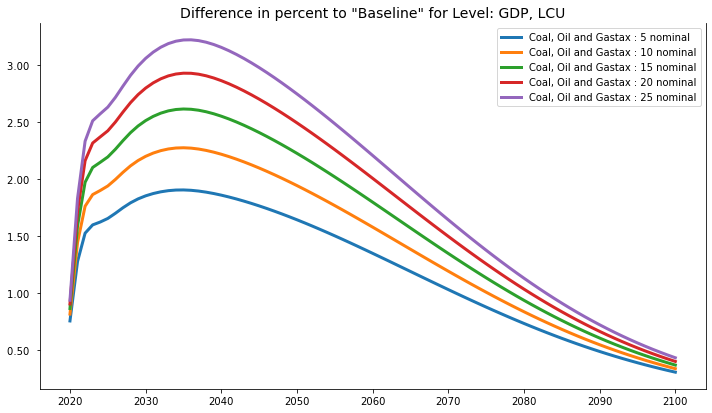

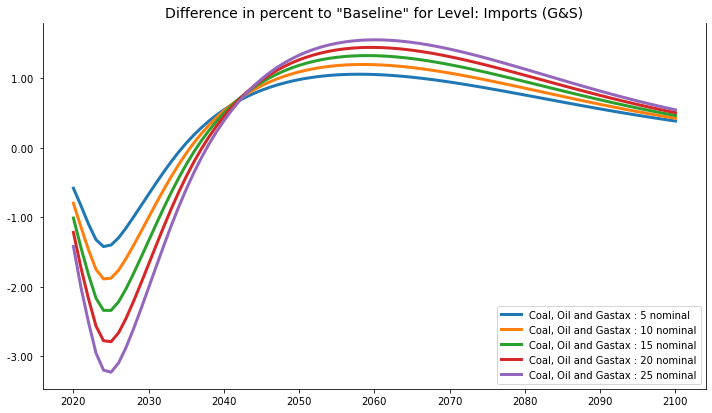

In [359]:
mpak.keep_plot('PAKNYGDPMKTPCN  PAKNEIMPGNFSKN', diffpct=1,legend="Change in level as a % of first keep scenario")


#### Differences in percent of baseline values

In this plot, the same results are presented, but as percent deviations from the baseline values of the displayed data.

{'PAKNYGDPMKTPCN': <Figure size 720x432 with 1 Axes>,
 'PAKNECONPRVTKN': <Figure size 720x432 with 1 Axes>}

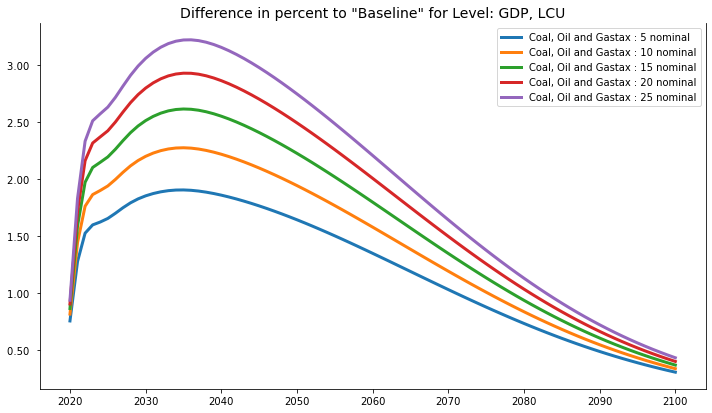

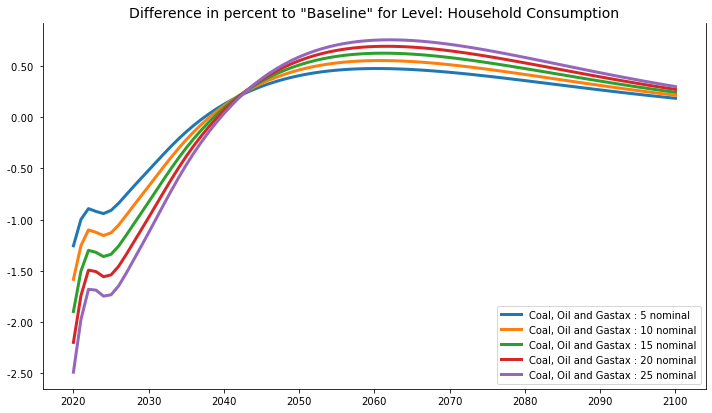

In [360]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN ', diffpct=1,showtype='level', legend=True)




### The `.keep_switch()` method

So far all of the `.keep_plot()` examples have displayed the results from all of the scenarios saved in the model object.

The `.keep_switch()` method restricts the number of scenarios on which subsequent calls to `.keep_plot()` (and `.keep_plot_multi()` -- see below) are executed on.  `.keep_switch()` can be passed a list of scenarios or using a wildcard selector.

#### The `.keep_solutions.keys()` method 
The `.keep_solutions.keys()` method generates a list of the solutions that have been kept previously.

In [361]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', 'Coal, Oil and Gastax : 5 nominal', 'Coal, Oil and Gastax : 10 nominal', 'Coal, Oil and Gastax : 15 nominal', 'Coal, Oil and Gastax : 20 nominal', 'Coal, Oil and Gastax : 25 nominal'])

To specify exactly which scenarios to show in a keep_plot, the `scenarios=` option of `.keepswitch()` must be initialized with a "|" delimited string of the names of the scenarios (retrieved above) that are to be displayed.

By placing the `.keepswitch()` in a `with` clause the scenario restriction will only apply to indented lines that follow the `with` construct.

In the example below, three scenarios are selected - the Baseline, and the 10 and 20 dollar Carbon taxes.  In this instance, because the `diffpct` option is set to `True` the last two are dislpayed as a percent difference relative the the first (baseline).

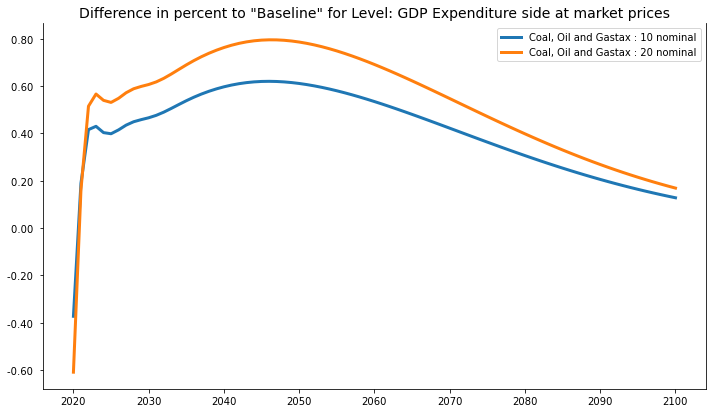

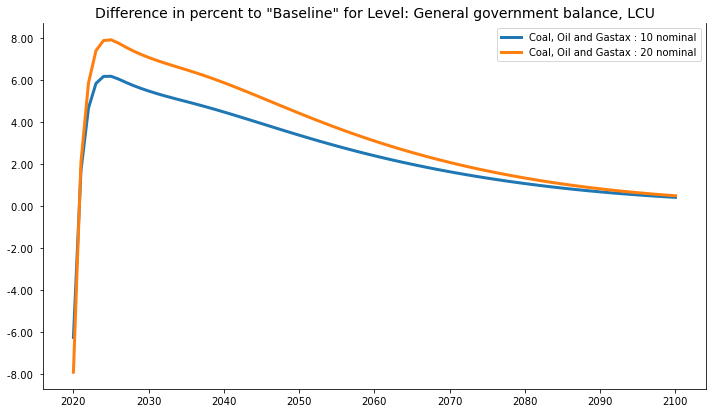

In [362]:
with mpak.keepswitch(scenarios='Baseline|Coal, Oil and Gastax : 10 nominal|Coal, Oil and Gastax : 20 nominal'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',diffpct=True,showtype='level',legend=True);

#### Keepswitch with wildcard selection

In this example a wild card is used to select the scenarios to be displayed. The wildcard expression `'*5?nominal*'` tells modelflow to only use scenarios where the carbon tax ended in 5.

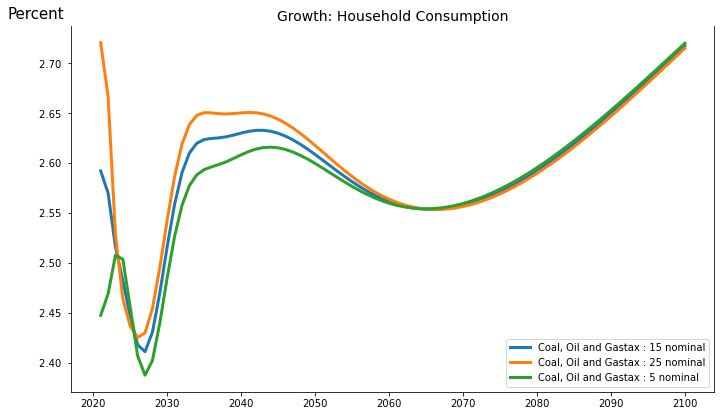

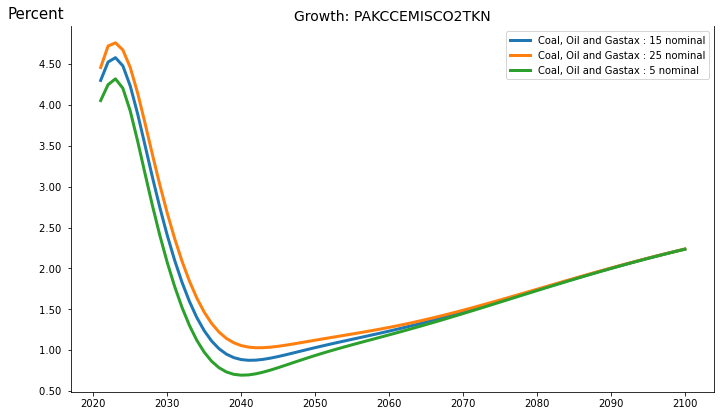

In [363]:

with mpak.keepswitch(scenarios='*5?nominal*'):
    mpak.keep_plot('PAKNECONPRVTKN PAKCCEMISCO2TKN',diffpct=False,showtype='growth',legend=True);

## The `.keep_plot_multi()` method

The `.keep_plot_multi()` method allows several charts to be displayed in a grid.  The size of each chart can be set with the `size=(w,h)` option, where the units of with and height are in centimetres.


In [364]:
mpak['pakccemis*'].des

PAKCCEMISCO2CKN : Coal
PAKCCEMISCO2GKN : Gas
PAKCCEMISCO2OKN : Oil
PAKCCEMISCO2TKN : PAKCCEMISCO2TKN


Below the `dim=0` option is set which means that each graph will show the results for all the variables from one simulation,

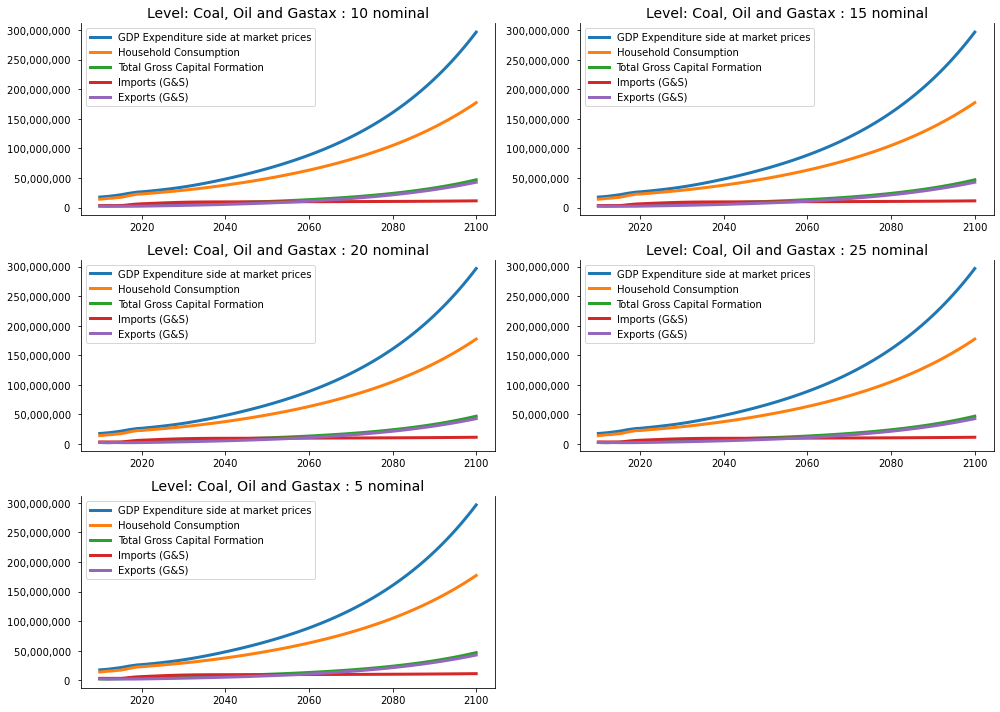

In [365]:
with mpak.keepswitch(scenarios='*nominal*'):
    var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2100,
                                    keep_dim=0,legend=1,
                                size=(14,10) ,title=''  );

In this example dim is set equal to one, which means that each graph shows the results for one variable across all of the selected scenarios.  In this case the showtype was changed to growth because in level terms the differences across scenarios tends to be swamped by the overall growth.



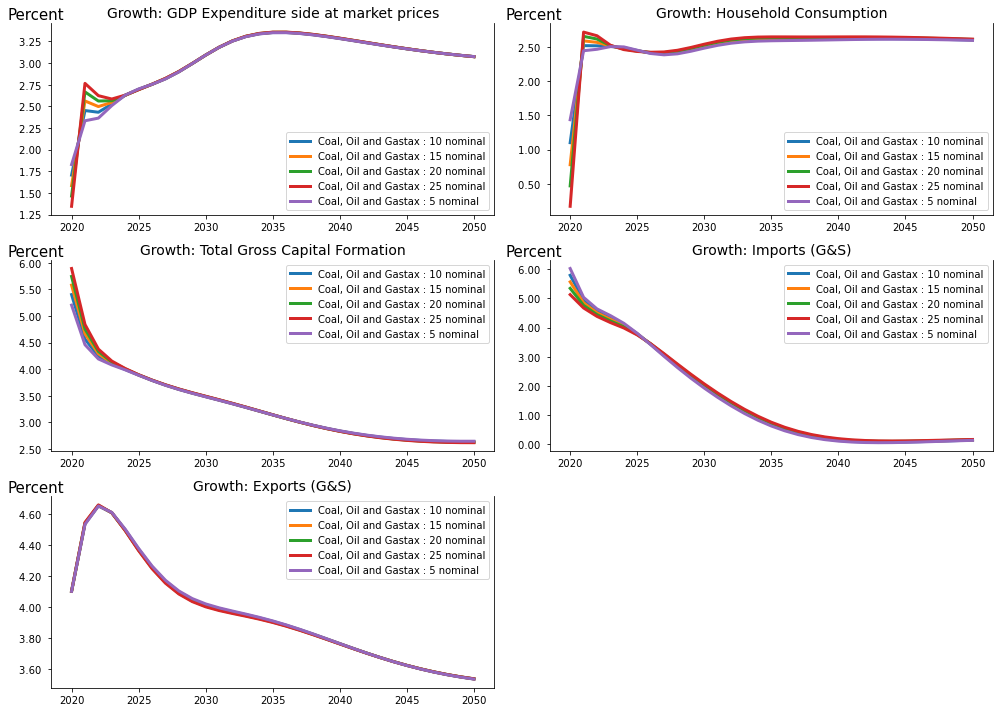

In [366]:
with mpak.keepswitch(scenarios='*nominal*'):
    var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2020,2050,
                                    keep_dim=1,showtype="growth",legend=1,size=(14,10) ,title=''  );

As indicated earlier both `keep_plot()` and `keep_plot_multi()` return a variable that can be used to embellish or modify the figures produced by the automatic routines.

For example the charts can be resized.

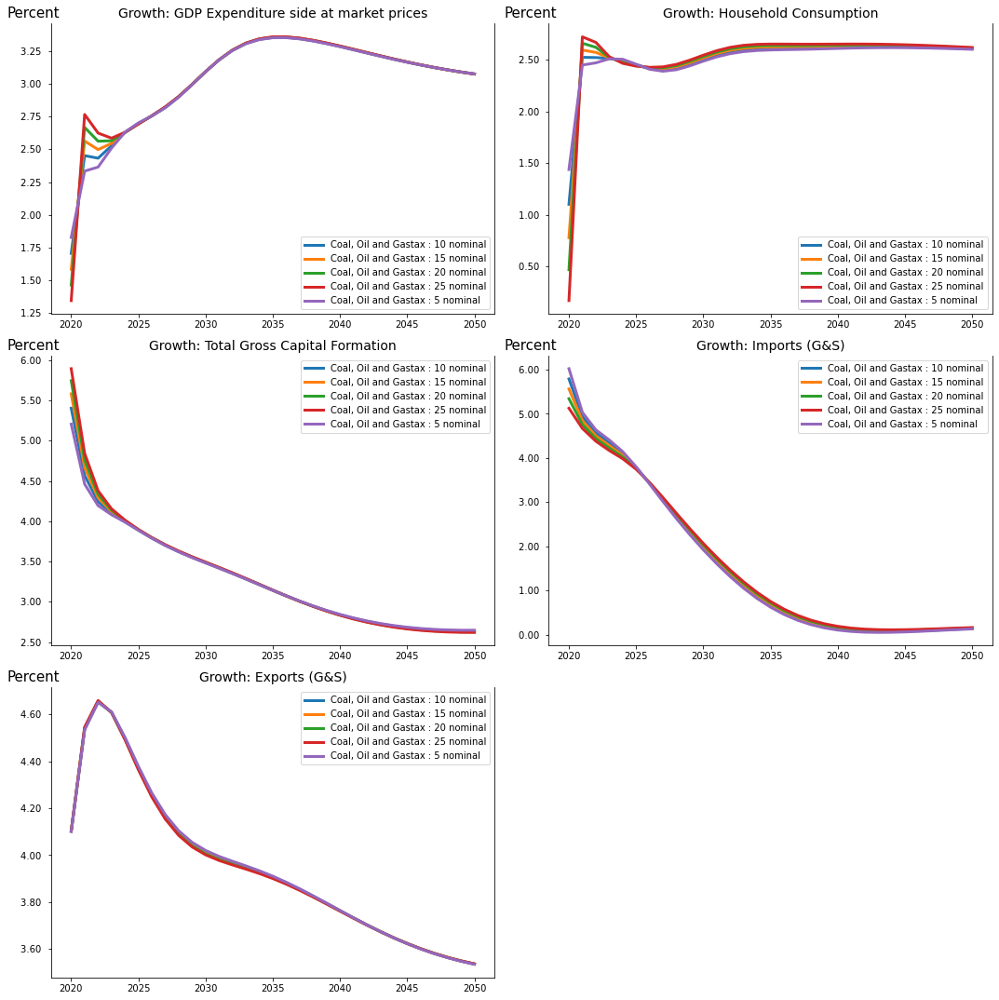

In [367]:
var_figs.set_size_inches(15,15)
var_figs


### Delete a chart from the grid

A chart can be deleted from the grid by referencing it and calling the `.remove()` method. In the example below the second chart is removed.

Individual charts can be deleted from the grid.  

:::{note}
The grid representation of the individual charts is returned as a 0-based vector of charts.  Thus the first figure is the zeroeth and the second is the first.
:::


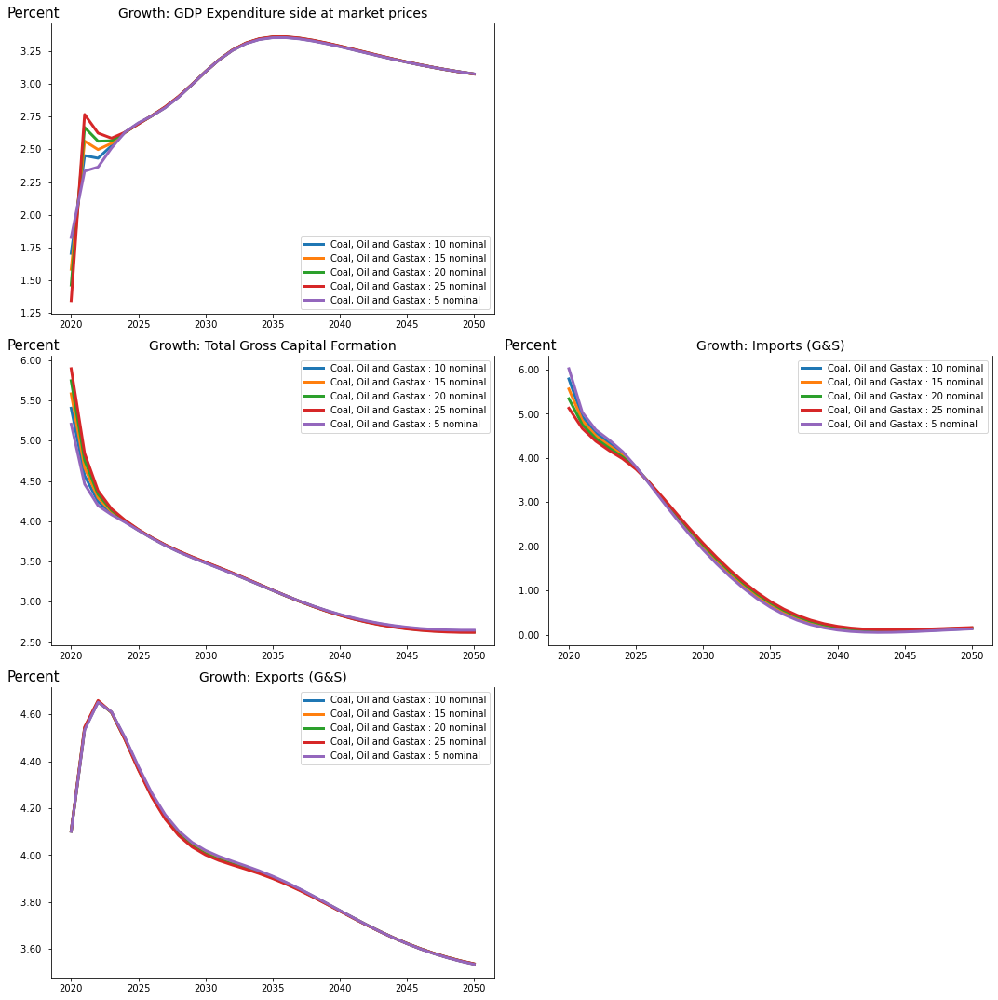

In [368]:


var_figs.axes[1].remove()
var_figs

The same mechanism can be used to revise the titles of the individual charts and annotate them.

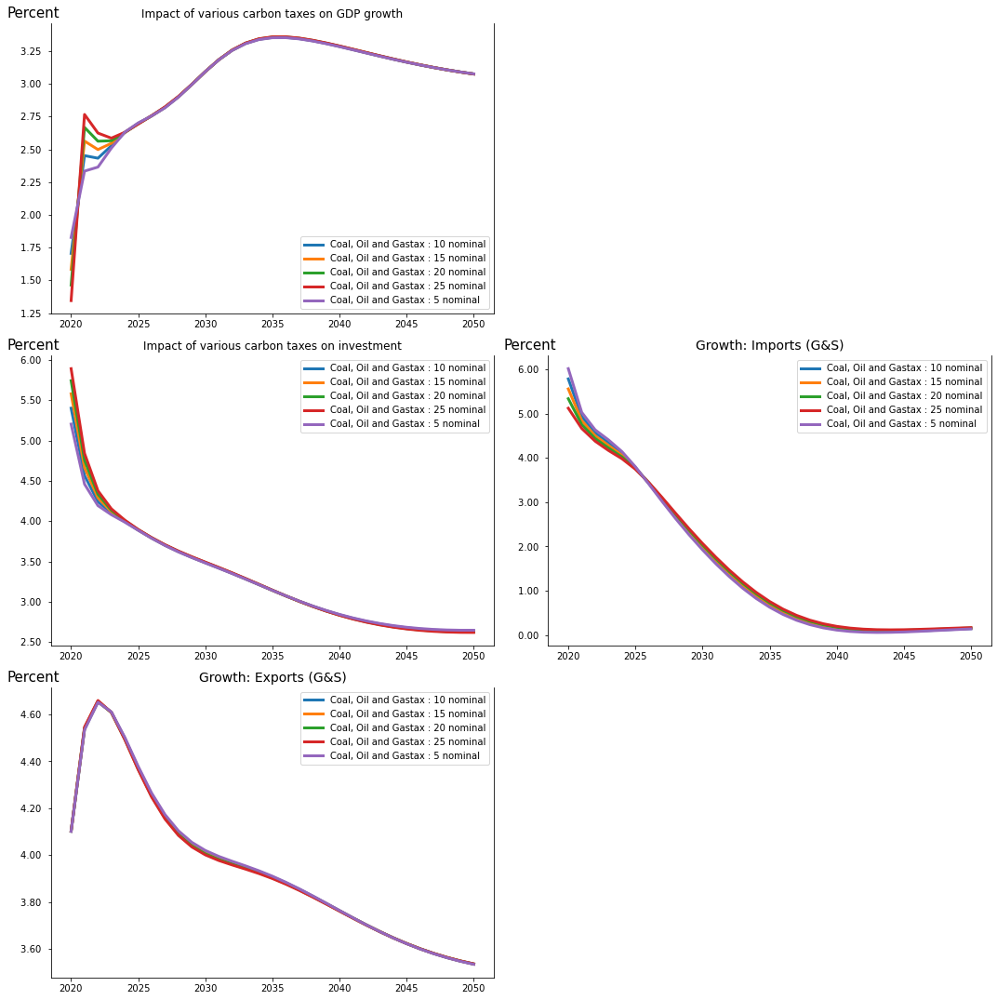

In [369]:
var_figs.axes[0].set_title('Impact of various carbon taxes on GDP growth');    # many properties can be set afterward 
var_figs.axes[1].set_title('Impact of various carbon taxes on investment');
var_figs

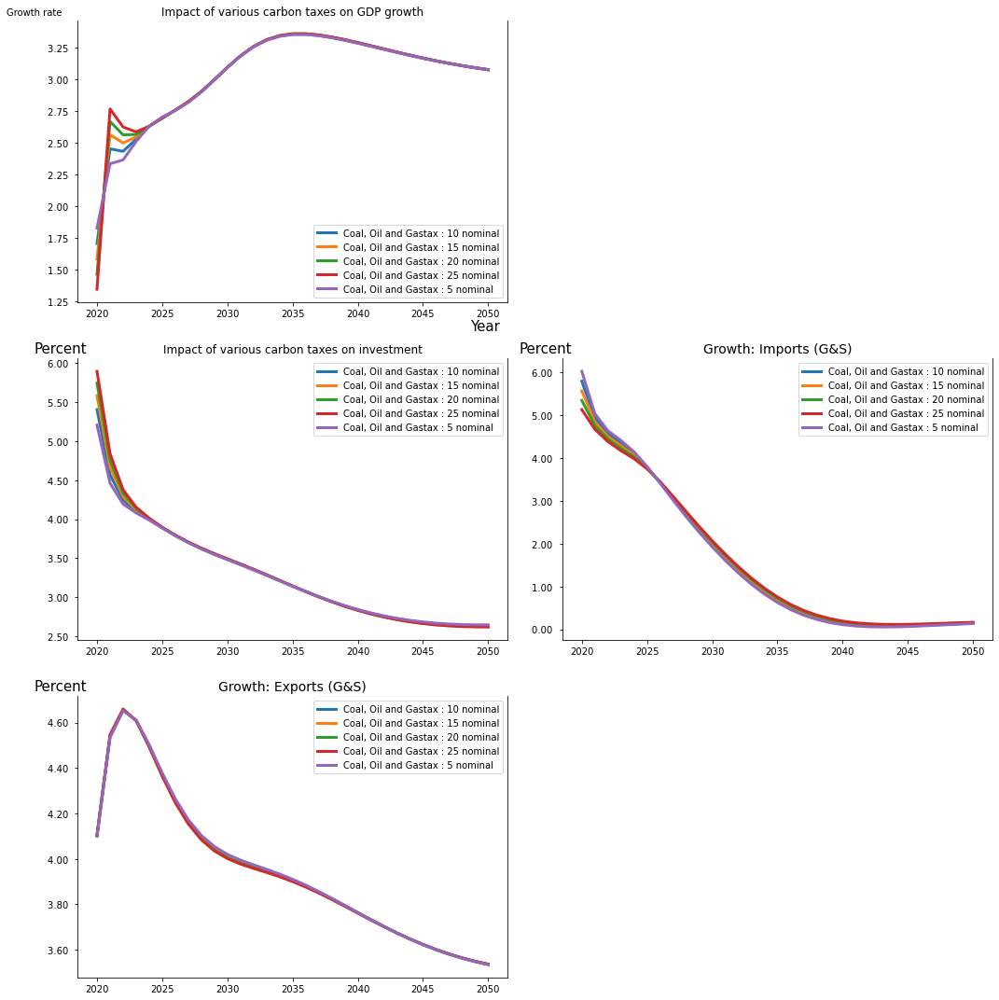

In [370]:
var_figs.axes[0].set_xlabel('Year')
var_figs.axes[0].set_ylabel('Growth rate',fontsize=10)
var_figs.axes[0].yaxis.set_label_coords(-0.1,1.02)
var_figs.axes[0].xaxis.set_label_coords(.95,-.06)
var_figs

Variables pointing to the individual charts can be defined and used to make modifications to individual charts within the overall figure.



In [371]:
fig1=var_figs.axes[0]
fig2=var_figs.axes[1]


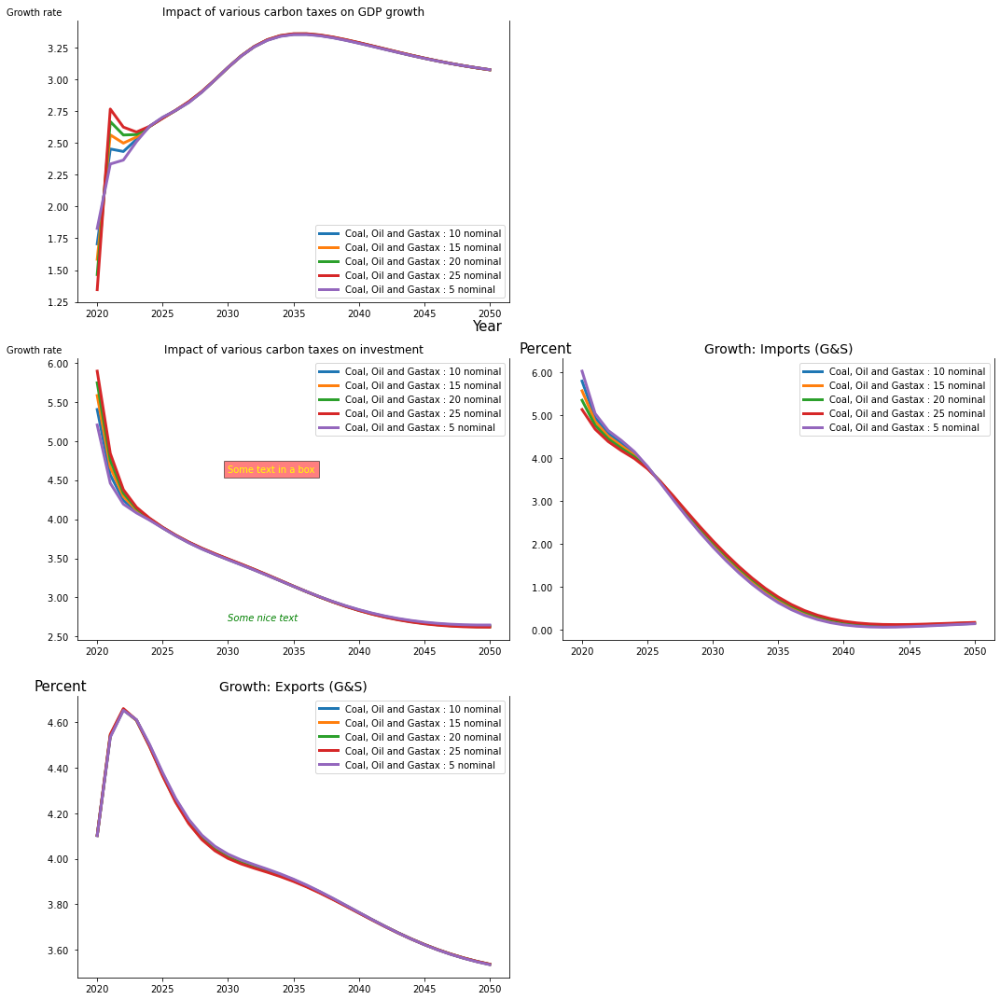

In [372]:
fig2.set_ylabel('Growth rate',fontsize=10)
fig2.yaxis.set_label_coords(-0.1,1.02) #place axes labels
fig2.xaxis.set_label_coords(.95,-.06)



fig2.text(2030.,4.6, 'Some text in a box', 
          color='yellow',bbox=dict(facecolor='red', alpha=0.5));
fig2.text(2030.,2.7, 'Some nice text', 
          style='italic',color='green');
          
var_figs
          

## Saving plots

`mathplotlib`, the library used by the two keep_plot routines allows for the saving of charts in a variety of formats, the library is flexible and will use the format assopciated with the file ending specified.

:::{Admonition} IB
This does not seem to work

:::


In [373]:

var_figs.savefig='CarbontaxImpacts.svg' 
var_figs.savefig='CarbontaxImpacts.jpg' 
var_figs.savefig='CarbontaxImpacts.png' 
var_figs.savefig='C:\mflow\modelflow-manual\papers\mfbook\content\05_WBModels\CarbontaxImpacts.pdf' 


### The results visualization widget view

When working in Jupyter Notebook, referencing a selection of series will cause a data visualization widget to be generated that allows you to look at results (`basesdf` vs `latestdf`) for the selected variables as tables or charts, as levels, as growth rates and as percent differences from baseline.

In [374]:
mpak['PAKNYGDPMKTPCN PAKNYGDPMKTPKN PAKGGEXPTOTLCN PAKGGREVTOTLCN PAKNECONGOVTKN']